# Library

In [ ]:
!pip install pydub
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import os

# Load Audio

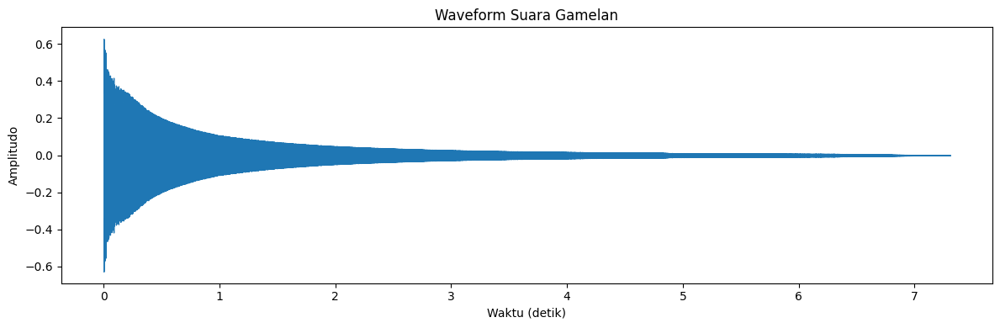

In [ ]:
# Load file audio gamelan (.aiff)
file_path = 'saron_p6.aiff'
y, sr = librosa.load(file_path, sr=None)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Suara Gamelan')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

ipd.display(ipd.Audio(y, rate=sr))

# Cari Carier dan Modulator

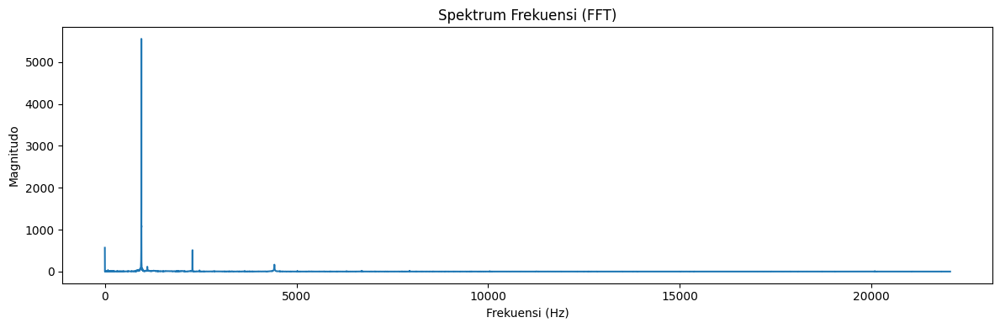

Frekuensi Fundamental (Carrier): 952.82 Hz
Frekuensi Modulator (f_m): 0.14 Hz


In [ ]:
# === FFT Analysis ===
Y = np.fft.fft(y)
magnitude = np.abs(Y)
freq = np.fft.fftfreq(len(magnitude), 1/sr)

# Ambil separuh spektrum (karena simetris)
half_len = len(magnitude) // 2
magnitude = magnitude[:half_len]
freq = freq[:half_len]

# Visualisasi spektrum frekuensi
plt.figure(figsize=(12, 4))
plt.plot(freq, magnitude)
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitudo')
plt.tight_layout()
plt.show()

# Cari frekuensi fundamental (carrier)
f_c = freq[np.argmax(magnitude)]
print(f"Frekuensi Fundamental (Carrier): {f_c:.2f} Hz")

# Cari sideband dengan ambil puncak lain selain fundamental
peak_indices = np.argsort(magnitude)[-10:]  # ambil 10 puncak terbesar
peak_freqs = freq[peak_indices]
peak_freqs = np.sort(peak_freqs)

# pilih sideband terdekat di atas f_c
f_m_candidates = peak_freqs[peak_freqs > f_c]
if len(f_m_candidates) > 0:
    f_m = f_m_candidates[0] - f_c
else:
    f_m = f_c / 2  # fallback
print(f"Frekuensi Modulator (f_m): {f_m:.2f} Hz")

# Function

In [ ]:
# === Bessel Approximation ===
def J0_approx(x):
    return 1 - (x**2)/4 + (x**4)/64 - (x**6)/2304 + (x**8)/147456

def J1_approx(x):
    return (x/2) - (x**3)/16 + (x**5)/384 - (x**7)/18432 + (x**9)/1474560

# FFT peak finder
def find_fft_peaks(y, sr, threshold_ratio=0.05):
    fft_spectrum = np.abs(np.fft.rfft(y))
    freqs = np.fft.rfftfreq(len(y), 1/sr)
    threshold = np.max(fft_spectrum) * threshold_ratio
    peak_mask = fft_spectrum > threshold
    peak_freqs = freqs[peak_mask]
    peak_amps = fft_spectrum[peak_mask]
    return peak_freqs, peak_amps, fft_spectrum, freqs

# Estimasi I dari carrier dan sideband
def estimate_I(y, sr, f_c, f_m):
    peak_freqs, peak_amps, fft_spectrum, freqs = find_fft_peaks(y, sr)

    idx_carrier = np.argmin(np.abs(freqs - f_c))
    amp_c = fft_spectrum[idx_carrier]

    sideband_freqs = [f_c + f_m, f_c - f_m]
    amp_sb = 0
    for sb_freq in sideband_freqs:
        if 0 < sb_freq < sr/2:
            idx_sb = np.argmin(np.abs(freqs - sb_freq))
            amp_sb = max(amp_sb, fft_spectrum[idx_sb])

    amp_ratio = amp_sb / amp_c if amp_c != 0 else 0

    if amp_ratio < 0.1:
        I_est = 0.5
    else:
        I_grid = np.linspace(0.1, 10, 10000)
        bessel_ratio = J1_approx(I_grid) / J0_approx(I_grid)
        I_est = I_grid[np.argmin(np.abs(bessel_ratio - amp_ratio))]

    print(f"Estimasi I: {I_est:.2f} (rasio sideband/carrier = {amp_ratio:.3f})")
    return I_est

# Sintesis FM dengan efek pukulan gamelan
def synthesize_fm(f_c, f_m, I0, duration=7.0, sr=44100,
                  attack_rate=30, decay_rate=0.8, noise_burst_ms=10):
    t = np.linspace(0, duration, int(sr * duration), endpoint=False)

    # Envelope pukulan (attack & decay bisa diatur)
    attack_env = 1 - np.exp(-attack_rate * t)
    decay_env = np.exp(-decay_rate * t)
    amp_env = attack_env * decay_env

    # Indeks modulasi meredup
    I_t = I0 * np.exp(-0.5 * t)

    # Noise burst (simulasi pukulan logam)
    noise = np.random.normal(0, 1, size=len(t))
    noise_burst = np.zeros_like(t)
    burst_duration = int((noise_burst_ms / 1000) * sr)  # ms → sample
    window = 0.5 * (1 - np.cos(2 * np.pi * np.arange(burst_duration) / burst_duration))
    noise_burst[:burst_duration] = noise[:burst_duration] * window

    # FM synthesis
    y_fm = amp_env * np.sin(2 * np.pi * f_c * t + I_t * np.sin(2 * np.pi * f_m * t))
    y_total = 0.3 * noise_burst + y_fm
    y_total /= np.max(np.abs(y_total))  # Normalisasi

    return t, y_total

# DEFAULT

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


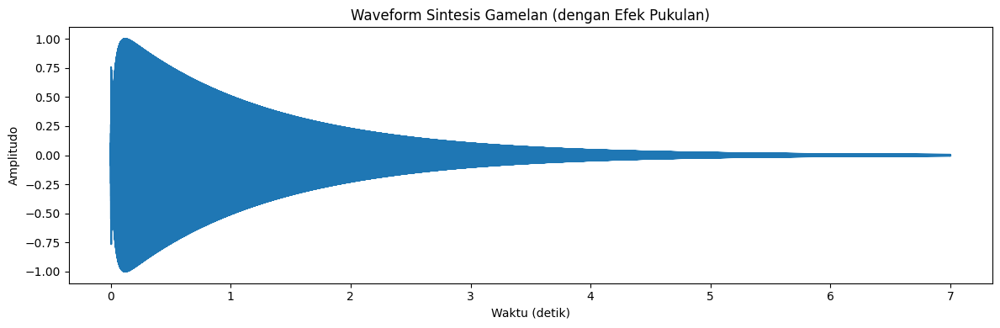

In [ ]:
# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

# Merubah Carrier Frequency (f_c)

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


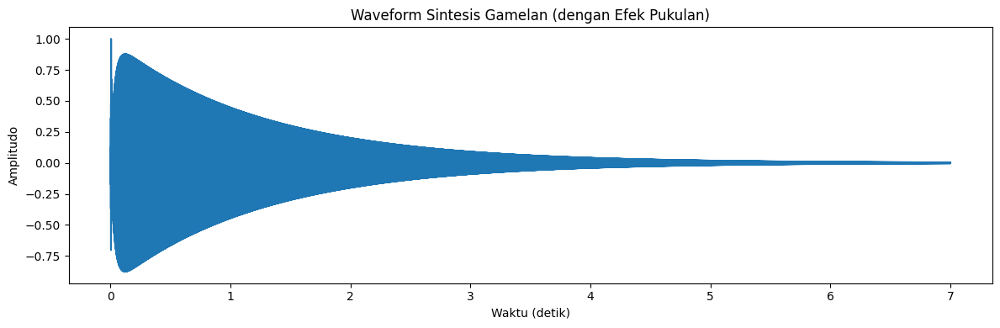

In [ ]:
# f_c LEBIH RENDAH

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=500,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


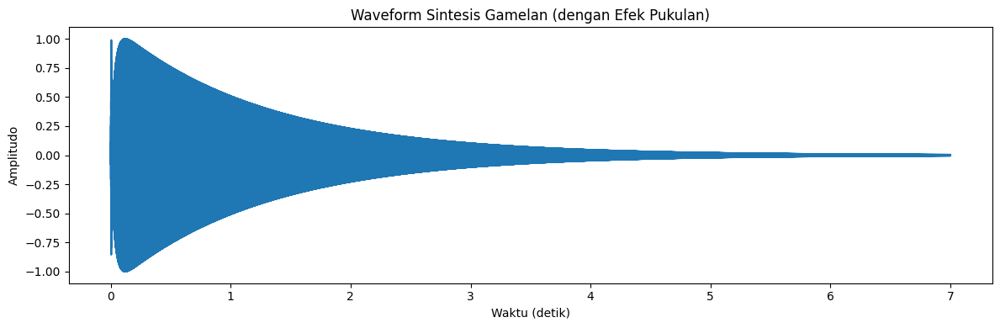

In [ ]:
# f_c LEBIH TINGGI

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=1100,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

# Merubah Modulator Frequency (f_m)

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


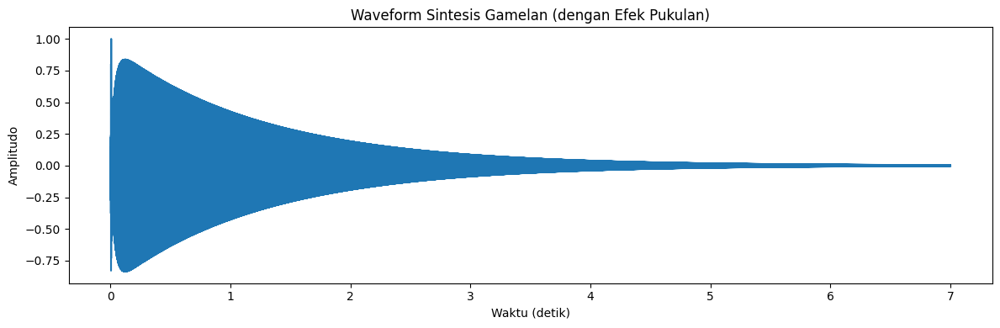

In [ ]:
#f_m LEBIH BESAR

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=1333,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


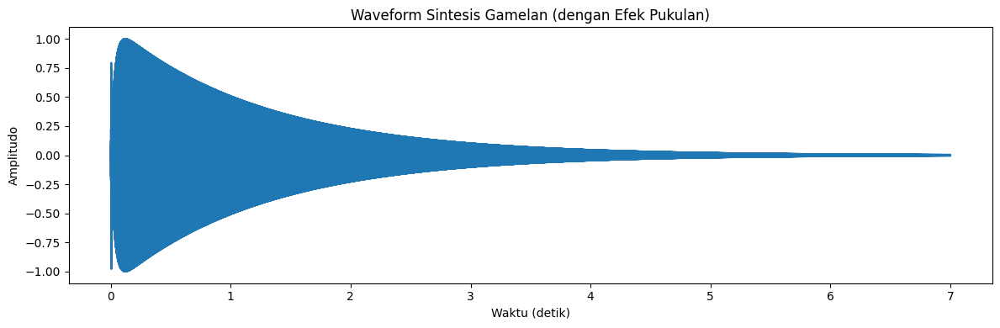

In [ ]:
#f_m LEBIH KECIL

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=0,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

# Merubah Index of Modulation (I0)

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


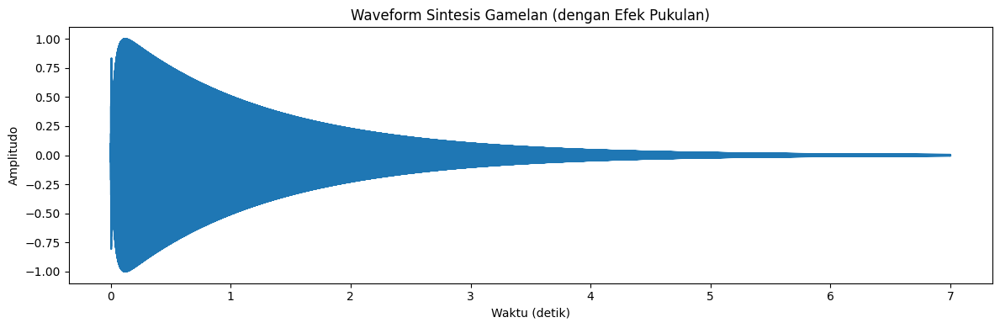

In [ ]:
# I0 KECIL

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=0,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


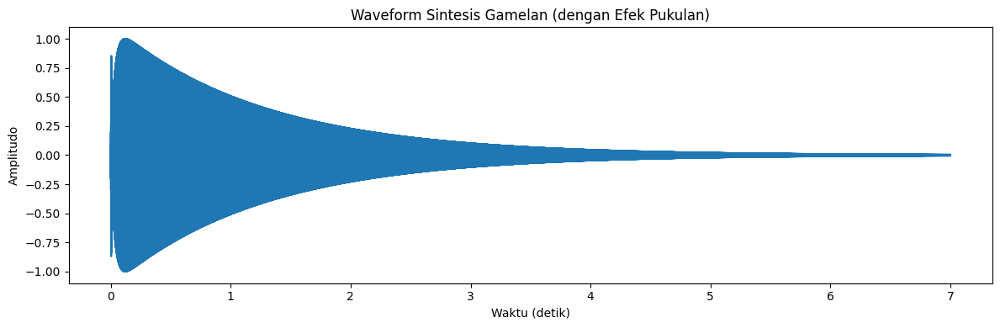

In [ ]:
# I0 BESAR

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=2000,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

# MERUBAH ENVELOPE

## Merubah Attack

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


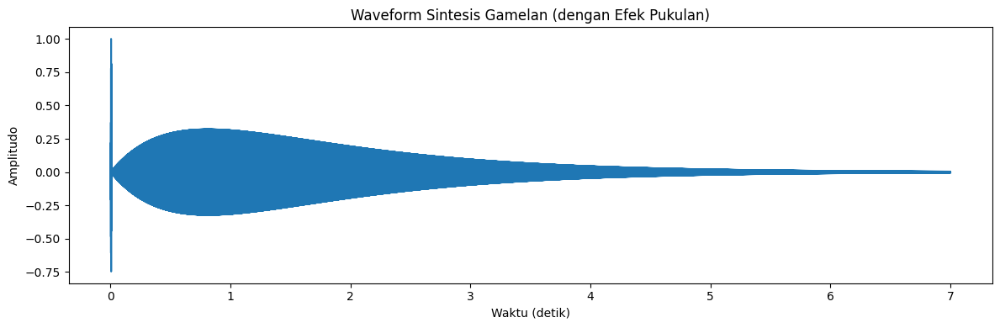

In [ ]:
# ATTACK LEBIH KECIL

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=1,     # (besar = lebih cepat naik)
    decay_rate=0.8,     # (besar = lebih cepat turun)
    noise_burst_ms=10   # ms
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))


Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


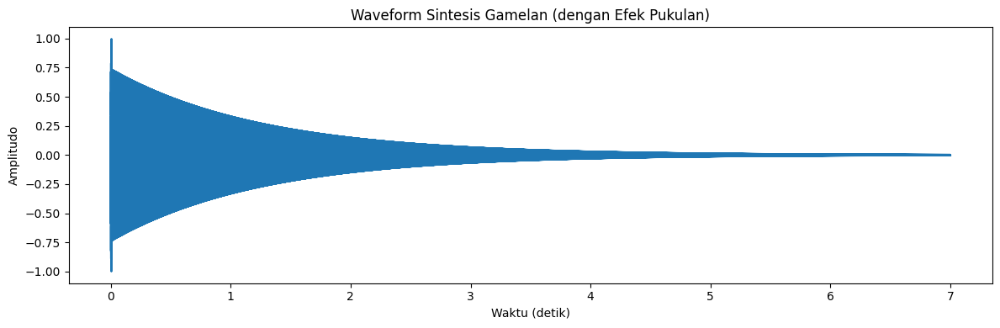

In [ ]:
# ATTACK LEBIH BESAR

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=2000,     # (besar = lebih cepat naik)
    decay_rate=0.8,     # (besar = lebih cepat turun)
    noise_burst_ms=10   # ms
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))


## Merubah Decay

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


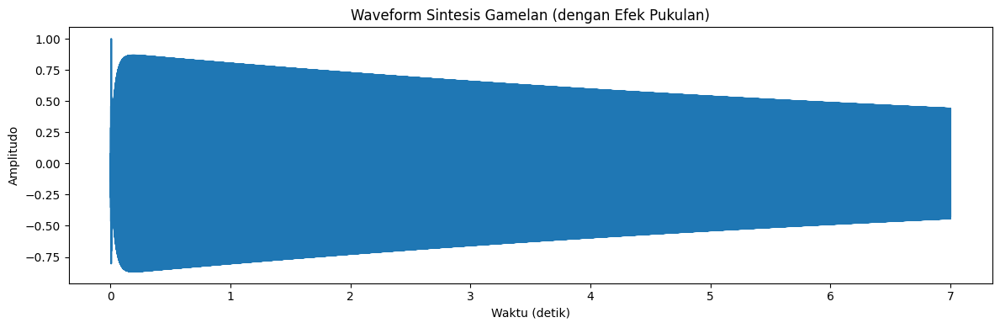

In [ ]:
# DECAY LEBIH KECIL

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,     # (besar = lebih cepat naik)
    decay_rate=0.1,     # (besar = lebih cepat turun)
    noise_burst_ms=10   # ms
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))


Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


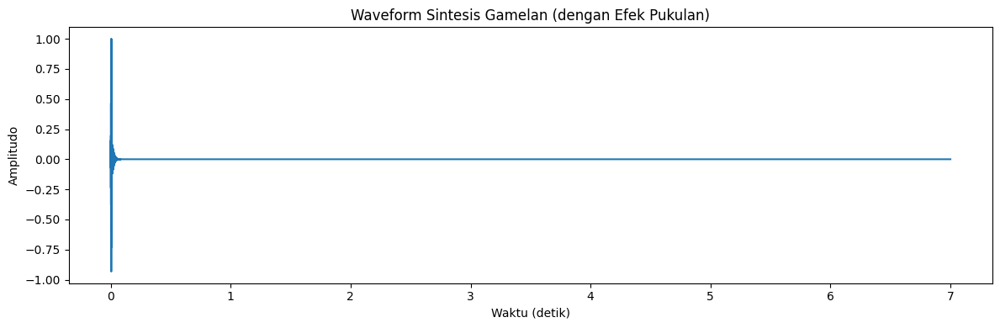

In [ ]:
# DECAY LEBIH BESAR

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,     # (besar = lebih cepat naik)
    decay_rate=100,     # (besar = lebih cepat turun)
    noise_burst_ms=10   # ms
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))


## Merubah Noise Burst

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


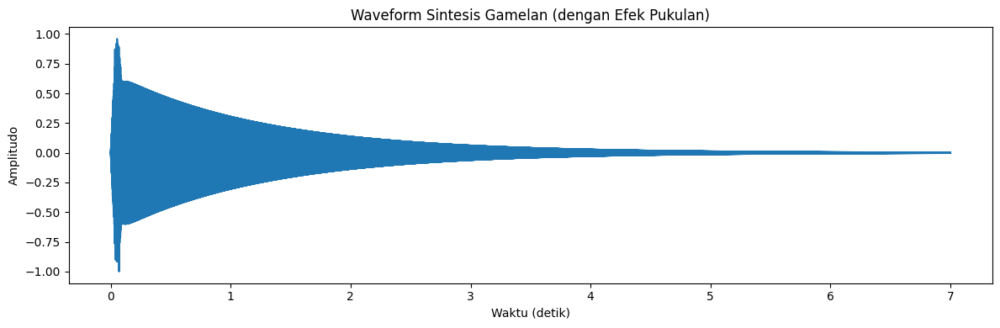

In [ ]:
# NOISE BURST LEBIH BESAR

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,     # (besar = lebih cepat naik)
    decay_rate=0.8,     # (besar = lebih cepat turun)
    noise_burst_ms=100   # ms
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))


Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


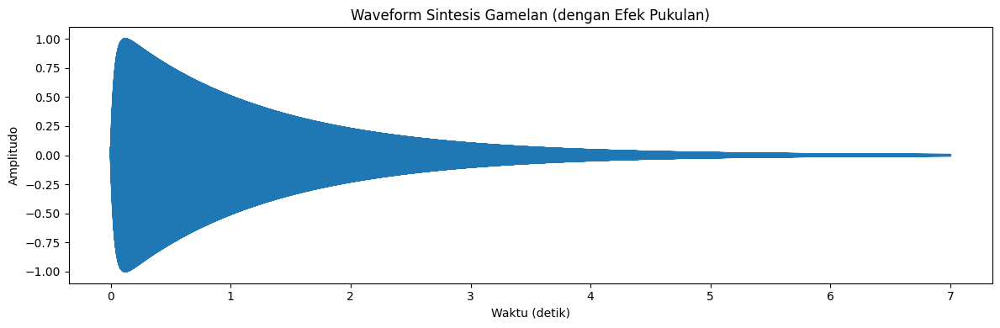

In [ ]:
# NOISE BURST LEBIH KECIL

# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,     # (besar = lebih cepat naik)
    decay_rate=0.8,     # (besar = lebih cepat turun)
    noise_burst_ms=0.1   # ms
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))


# Analisis

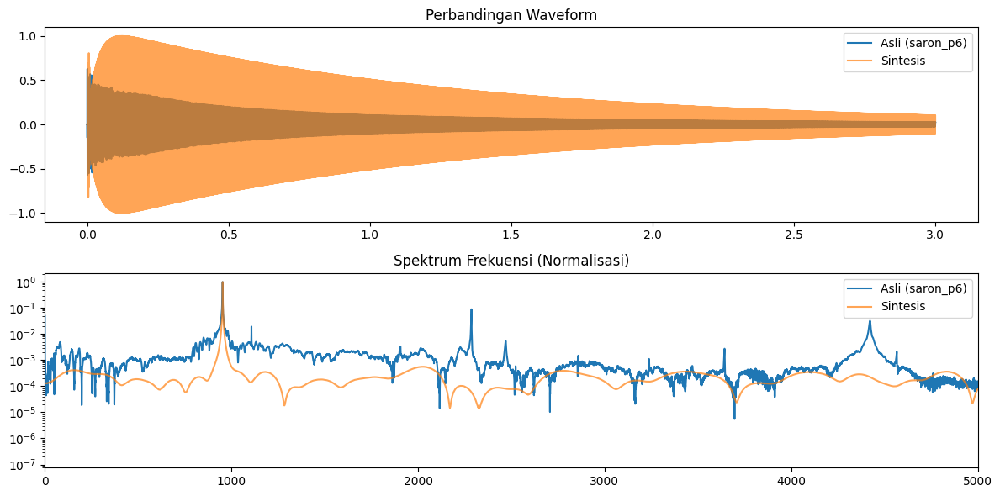

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf

# Load kedua file menggunakan soundfile
file_ref = "saron_p6.wav"
file_synth = "sintesis_saron_p6.wav"

y_ref, sr_ref = sf.read(file_ref)
y_synth, sr_synth = sf.read(file_synth)

# Pastikan mono
if y_ref.ndim > 1:
    y_ref = np.mean(y_ref, axis=1)
if y_synth.ndim > 1:
    y_synth = np.mean(y_synth, axis=1)

# Samplerate penyamaan
if sr_ref != sr_synth:
    sr = min(sr_ref, sr_synth)
else:
    sr = sr_ref

# Ambil 3 detik pertama
duration = 3
y_ref = y_ref[:sr * duration]
y_synth = y_synth[:sr * duration]

# FFT function
def compute_fft(y, sr):
    fft_spectrum = np.abs(np.fft.rfft(y))
    freqs = np.fft.rfftfreq(len(y), 1/sr)
    return freqs, fft_spectrum / np.max(fft_spectrum)

freqs_ref, fft_ref = compute_fft(y_ref, sr)
freqs_synth, fft_synth = compute_fft(y_synth, sr)

# Plot perbandingan waveform & spektrum
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(np.linspace(0, duration, len(y_ref)), y_ref, label="Asli (saron_p6)")
plt.plot(np.linspace(0, duration, len(y_synth)), y_synth, label="Sintesis", alpha=0.7)
plt.legend()
plt.title("Perbandingan Waveform")

plt.subplot(2, 1, 2)
plt.semilogy(freqs_ref, fft_ref, label="Asli (saron_p6)")
plt.semilogy(freqs_synth, fft_synth, label="Sintesis", alpha=0.7)
plt.xlim(0, 5000)
plt.legend()
plt.title("Spektrum Frekuensi (Normalisasi)")

plt.tight_layout()
plt.show()


# COBA-COBA

Estimasi I: 1.43 (rasio sideband/carrier = 1.000)


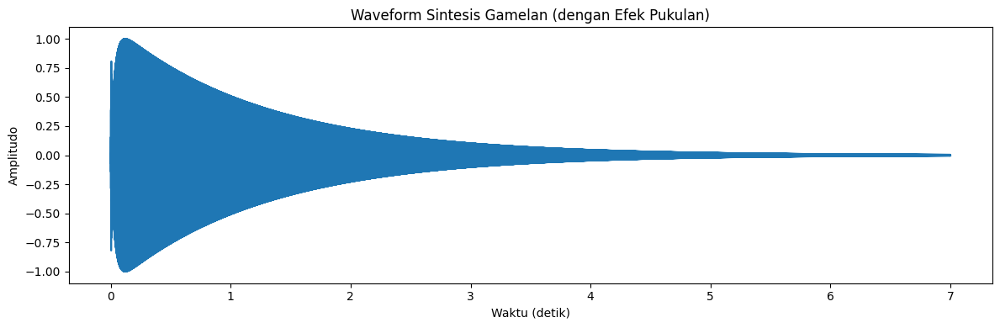

In [ ]:
# === MAIN ===
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Estimasi indeks I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan
t, y_synth = synthesize_fm(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=30,
    decay_rate=0.8,
    noise_burst_ms=10
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (dengan Efek Pukulan)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))

Estimated f_c = 953.00 Hz, estimated f_m = 154.00 Hz
Estimated I (heuristic) = 0.603, sideband/carrier ratio = 0.0103


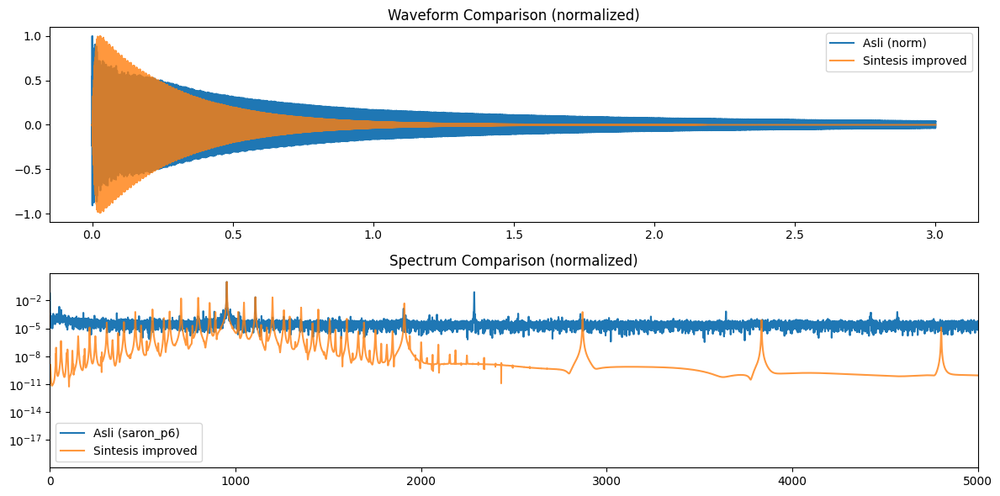

Synthesized file saved to: sintesis_improved_saron_p6.wav


In [ ]:
# Improved FM + additive + transient synthesis to better match gamelan saron
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
from scipy import signal
import IPython.display as ipd
import os

# Paths (files uploaded earlier)
file_ref = "saron_p6.wav"
out_path = "sintesis_improved_saron_p6.wav"

# Helper: read mono
def read_mono(path):
    y, sr = sf.read(path)
    if y.ndim > 1:
        y = np.mean(y, axis=1)
    return y, sr

y_ref, sr = read_mono(file_ref)
# use short segment for analysis
seg_len = min(len(y_ref), sr * 3)
y_ref_seg = y_ref[:seg_len]

# FFT peak detection helper
def find_peaks_fft(y, sr, n_peaks=6, min_freq=20):
    N = len(y)
    S = np.abs(np.fft.rfft(y * np.hanning(N)))
    freqs = np.fft.rfftfreq(N, 1/sr)
    # ignore below min_freq
    mask = freqs > min_freq
    freqs = freqs[mask]
    S = S[mask]
    peaks_idx = np.argsort(S)[-n_peaks:][::-1]
    peak_freqs = freqs[peaks_idx]
    peak_amps = S[peaks_idx]
    return peak_freqs, peak_amps, freqs, S

peak_freqs, peak_amps, all_freqs, all_S = find_peaks_fft(y_ref_seg, sr, n_peaks=20)
peak_freqs_sorted = np.sort(peak_freqs)
# choose carrier as strongest peak
f_c = peak_freqs[np.argmax(peak_amps)]
# choose modulator as next prominent peak difference
# pick nearest peak above fc to be sideband candidate
candidates = [f for f in peak_freqs_sorted if f > f_c + 20]
f_m = candidates[0] - f_c if len(candidates) > 0 else f_c*0.5

print(f"Estimated f_c = {f_c:.2f} Hz, estimated f_m = {f_m:.2f} Hz")

# Improved synthesis function
def synth_improved(f_c, f_m, I0, duration=3.0, sr=44100,
                   attack_rate=200.0, decay_rate=3.0,
                   noise_level=0.9, noise_ms=8,
                   add_partials=6, partial_decay=1.8,
                   bp_bw=0.35,  # bandpass relative bandwidth
                   secondary_mod_ratio=0.5):
    t = np.linspace(0, duration, int(sr * duration), endpoint=False)
    N = len(t)
    # sharply impulsive attack: use raised-cosine transient envelope for first 10-50 ms
    trans_ms = max(3, noise_ms)  # transient window
    trans_samples = int(sr * (trans_ms/1000.0))
    trans_env = np.ones(N)
    env_attack = 1.0 - np.exp(-attack_rate * t)  # fast attack if attack_rate large
    env_decay = np.exp(-decay_rate * t)         # faster decay if decay_rate large
    amp_env = env_attack * env_decay
    # Add short broadband noise burst (colored later)
    noise = np.random.randn(N)
    noise_burst = np.zeros(N)
    win = 0.5 * (1 - np.cos(2*np.pi*np.arange(trans_samples)/max(1,trans_samples)))
    noise_burst[:trans_samples] = noise[:trans_samples] * win
    # bandpass the transient noise around fc to make it metallic
    # construct bandpass butter filter
    nyq = sr/2
    center = f_c
    # compute low/high cutoff as center*(1 +/- bw)
    low = max(20.0, center*(1 - bp_bw))
    high = min(nyq-100, center*(1 + bp_bw))
    b, a = signal.butter(2, [low/nyq, high/nyq], btype='band')
    colored_noise = signal.lfilter(b, a, noise_burst)
    # Secondary FM operator for extra inharmonicity/complexity
    mod2 = secondary_mod_ratio * I0 * np.sin(2*np.pi*(f_m*1.6) * t * (1 + 0.0005*np.sin(2*np.pi*0.3*t)))
    # Primary FM instantaneous index decaying
    I_t = I0 * np.exp(-1.5 * t)  # quicker reduction of I for more realistic metallic decay
    # main FM: carrier phase modulated by two modulators (one scaled)
    y_fm = np.sin(2*np.pi*f_c*t + (I_t * np.sin(2*np.pi*f_m*t) + mod2))
    # Additive partials useful for metallic instruments (slightly inharmonic)
    partials = np.zeros(N)
    for n in range(1, add_partials+1):
        # slight inharmonicity: multiply harmonic by (1 + small detune)
        detune = 1.0 + 0.002 * (n-1)
        amp = np.exp(-partial_decay*(n-1))  # exponential amplitude rolloff for higher partials
        partials += amp * np.sin(2*np.pi*(f_c * n * detune) * t)
    # combine: weighted sum fm + partials + colored noise transient
    y = 0.9 * amp_env * (0.8 * y_fm + 0.5 * partials) + noise_level * colored_noise
    # apply gentle resonant filtering to emulate bar resonance (one-pole peaking)
    # design a narrow peaking filter with IIR (biquad) using bandpass then emphasize
    b2, a2 = signal.iirpeak(f_c/nyq, Q=10)  # Q=10 peaking near fc
    y = signal.lfilter(b2, a2, y)
    # final normalization
    y = y / (np.max(np.abs(y)) + 1e-12)
    # save
    sf.write(out_path, y.astype(np.float32), sr)
    return t, y, sr

# Estimate I from simple measure: ratio of sideband to carrier (rough)
def estimate_I_simple(y, sr, f_c, f_m):
    N = len(y)
    S = np.abs(np.fft.rfft(y * np.hanning(N)))
    freqs = np.fft.rfftfreq(N, 1/sr)
    idx_c = np.argmin(np.abs(freqs - f_c))
    idx_sb = np.argmin(np.abs(freqs - (f_c + f_m)))
    amp_c = S[idx_c]
    amp_sb = S[idx_sb]
    ratio = amp_sb/amp_c if amp_c>0 else 0.0
    # map ratio to I roughly (this is heuristic)
    I_est = np.clip(0.5 + 10*ratio, 0.2, 8.0)
    return I_est, ratio

I_est, ratio = estimate_I_simple(y_ref_seg, sr, f_c, f_m)
print(f"Estimated I (heuristic) = {I_est:.3f}, sideband/carrier ratio = {ratio:.4f}")

# synthesize with suggested parameters tuned to be more impulsive and metallic
t, y_new, sr_out = synth_improved(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=3.0,
    sr=sr,
    attack_rate=200.0,
    decay_rate=3.5,
    noise_level=0.9,
    noise_ms=6,
    add_partials=8,
    partial_decay=1.6,
    bp_bw=0.45,
    secondary_mod_ratio=0.6
)

# Plot comparison with original short segment
plt.figure(figsize=(12,6))
plt.subplot(2,1,1)
plt.plot(np.linspace(0,3,len(y_ref_seg)), y_ref_seg/np.max(np.abs(y_ref_seg)), label='Asli (norm)')
plt.plot(np.linspace(0,3,len(y_new)), y_new, label='Sintesis improved', alpha=0.8)
plt.legend()
plt.title("Waveform Comparison (normalized)")

plt.subplot(2,1,2)
def compute_fft(y):
    S = np.abs(np.fft.rfft(y*np.hanning(len(y))))
    f = np.fft.rfftfreq(len(y), 1/sr)
    return f, S/np.max(S)
f_ref, S_ref = compute_fft(y_ref_seg)
f_new, S_new = compute_fft(y_new)
plt.semilogy(f_ref, S_ref, label='Asli (saron_p6)')
plt.semilogy(f_new, S_new, label='Sintesis improved', alpha=0.8)
plt.xlim(0,5000)
plt.legend()
plt.title("Spectrum Comparison (normalized)")
plt.tight_layout()
plt.show()

# Playback the improved synthesis and provide file path
display(ipd.Audio(y_new, rate=sr))
print("Synthesized file saved to:", out_path)



Estimated f_c = 953.00 Hz, estimated f_m = 154.00 Hz
Estimated I (heuristic) = 0.603, sideband/carrier ratio = 0.0103


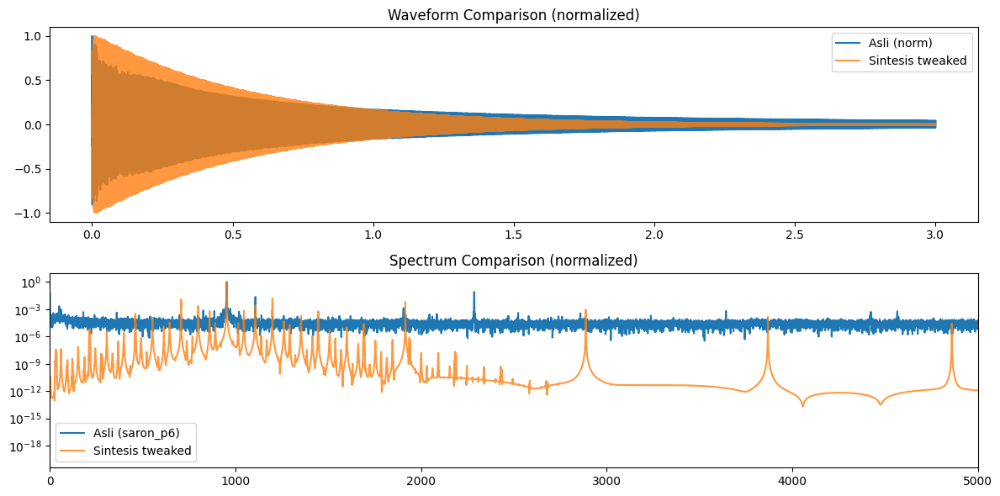

Synthesized file saved to: sintesis_improved_saron_p6_tweaked.wav


In [41]:
# Improved FM + additive + transient synthesis to better match gamelan saron
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
from scipy import signal
import IPython.display as ipd
import os

# Paths (files uploaded earlier)
file_ref = "saron_p6.wav"
out_path = "sintesis_improved_saron_p6_tweaked.wav"

# Helper: read mono
def read_mono(path):
    y, sr = sf.read(path)
    if y.ndim > 1:
        y = np.mean(y, axis=1)
    return y, sr

y_ref, sr = read_mono(file_ref)
# use short segment for analysis
seg_len = min(len(y_ref), sr * 3)
y_ref_seg = y_ref[:seg_len]

# FFT peak detection helper
def find_peaks_fft(y, sr, n_peaks=6, min_freq=20):
    N = len(y)
    S = np.abs(np.fft.rfft(y * np.hanning(N)))
    freqs = np.fft.rfftfreq(N, 1/sr)
    # ignore below min_freq
    mask = freqs > min_freq
    freqs = freqs[mask]
    S = S[mask]
    peaks_idx = np.argsort(S)[-n_peaks:][::-1]
    peak_freqs = freqs[peaks_idx]
    peak_amps = S[peaks_idx]
    return peak_freqs, peak_amps, freqs, S

peak_freqs, peak_amps, all_freqs, all_S = find_peaks_fft(y_ref_seg, sr, n_peaks=20)
peak_freqs_sorted = np.sort(peak_freqs)
# choose carrier as strongest peak
f_c = peak_freqs[np.argmax(peak_amps)]
# choose modulator as next prominent peak difference
# pick nearest peak above fc to be sideband candidate
candidates = [f for f in peak_freqs_sorted if f > f_c + 20]
f_m = candidates[0] - f_c if len(candidates) > 0 else f_c*0.5

print(f"Estimated f_c = {f_c:.2f} Hz, estimated f_m = {f_m:.2f} Hz")

# Improved synthesis function (tweaked parameters available)
def synth_improved(f_c, f_m, I0, duration=3.0, sr=44100,
                   attack_rate=500.0, decay_rate=5.0,
                   noise_level=0.8, noise_ms=5,
                   add_partials=10, partial_decay=1.4,
                   bp_bw=0.45,  # bandpass relative bandwidth
                   secondary_mod_ratio=0.6,
                   detune_step=0.003):
    """
    detune_step: fractional detune per partial (e.g. 0.003 ~= 0.3% per partial)
    attack_rate: larger => faster attack
    decay_rate: larger => faster overall amplitude decay
    noise_ms: transient noise duration in milliseconds
    """
    t = np.linspace(0, duration, int(sr * duration), endpoint=False)
    N = len(t)
    # transient window length (ms)
    trans_ms = max(3, noise_ms)
    trans_samples = int(sr * (trans_ms / 1000.0))
    # envelopes
    env_attack = 1.0 - np.exp(-attack_rate * t)  # fast attack if attack_rate large
    env_decay = np.exp(-decay_rate * t)         # faster decay if decay_rate large
    amp_env = env_attack * env_decay
    # Add short broadband noise burst (colored later)
    noise = np.random.randn(N)
    noise_burst = np.zeros(N)
    win = 0.5 * (1 - np.cos(2 * np.pi * np.arange(trans_samples) / max(1, trans_samples)))
    noise_burst[:trans_samples] = noise[:trans_samples] * win
    # Bandpass the transient noise around fc to make it metallic
    nyq = sr / 2
    center = f_c
    low = max(20.0, center * (1 - bp_bw))
    high = min(nyq - 100, center * (1 + bp_bw))
    b, a = signal.butter(2, [low / nyq, high / nyq], btype='band')
    colored_noise = signal.lfilter(b, a, noise_burst)
    # Secondary FM operator for extra inharmonicity/complexity
    mod2 = secondary_mod_ratio * I0 * np.sin(2 * np.pi * (f_m * 1.6) * t * (1 + 0.0005 * np.sin(2 * np.pi * 0.3 * t)))
    # Primary FM instantaneous index decaying (faster reduction)
    I_t = I0 * np.exp(-2.0 * t)
    # main FM: carrier phase modulated by two modulators (one scaled)
    y_fm = np.sin(2 * np.pi * f_c * t + (I_t * np.sin(2 * np.pi * f_m * t) + mod2))
    # Additive partials useful for metallic instruments (slightly inharmonic)
    partials = np.zeros(N)
    for n in range(1, add_partials + 1):
        # slight inharmonicity: multiply harmonic by (1 + detune_step*(n-1))
        detune = 1.0 + detune_step * (n - 1)  # e.g., 0.003*(n-1) => ~0.3% per partial
        amp = np.exp(-partial_decay * (n - 1))  # exponential amplitude rolloff for higher partials
        partials += amp * np.sin(2 * np.pi * (f_c * n * detune) * t)
    # combine: weighted sum fm + partials + colored noise transient
    y = 0.9 * amp_env * (0.8 * y_fm + 0.5 * partials) + noise_level * colored_noise
    # apply gentle resonant filtering to emulate bar resonance (narrow peaking)
    b2, a2 = signal.iirpeak(f_c / nyq, Q=10)  # Q=10 peaking near fc
    y = signal.lfilter(b2, a2, y)
    # final normalization
    y = y / (np.max(np.abs(y)) + 1e-12)
    # save
    sf.write(out_path, y.astype(np.float32), sr)
    return t, y, sr

# Estimate I from simple measure: ratio of sideband to carrier (rough)
def estimate_I_simple(y, sr, f_c, f_m):
    N = len(y)
    S = np.abs(np.fft.rfft(y * np.hanning(N)))
    freqs = np.fft.rfftfreq(N, 1 / sr)
    idx_c = np.argmin(np.abs(freqs - f_c))
    idx_sb = np.argmin(np.abs(freqs - (f_c + f_m)))
    amp_c = S[idx_c]
    amp_sb = S[idx_sb]
    ratio = amp_sb / amp_c if amp_c > 0 else 0.0
    # map ratio to I roughly (this is heuristic)
    I_est = np.clip(0.5 + 10 * ratio, 0.2, 8.0)
    return I_est, ratio

I_est, ratio = estimate_I_simple(y_ref_seg, sr, f_c, f_m)
print(f"Estimated I (heuristic) = {I_est:.3f}, sideband/carrier ratio = {ratio:.4f}")

# synthesize with tweaked parameters
t, y_new, sr_out = synth_improved(
    f_c=f_c,
    f_m=f_m,
    I0=I_est,
    duration=7.0,
    sr=sr,
    attack_rate=500.0,    # stronger / faster attack
    decay_rate=0.8,       # faster overall decay (shorter sustain)
    noise_level=0.8,
    noise_ms=5,           # transient ~5 ms (in 4-8ms range)
    add_partials=10,      # more partials (6-12 recommended)
    partial_decay=1.4,    # slower rolloff than before (tunable)
    bp_bw=0.45,
    secondary_mod_ratio=0.6,
    detune_step=0.005     # ~0.3% detune per partial (0.1-0.5% range)
)

# Plot comparison with original short segment
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(np.linspace(0, 3, len(y_ref_seg)), y_ref_seg / np.max(np.abs(y_ref_seg)), label='Asli (norm)')
plt.plot(np.linspace(0, 3, len(y_new)), y_new, label='Sintesis tweaked', alpha=0.8)
plt.legend()
plt.title("Waveform Comparison (normalized)")

plt.subplot(2, 1, 2)
def compute_fft(y):
    S = np.abs(np.fft.rfft(y * np.hanning(len(y))))
    f = np.fft.rfftfreq(len(y), 1 / sr)
    return f, S / np.max(S)
f_ref, S_ref = compute_fft(y_ref_seg)
f_new, S_new = compute_fft(y_new)
plt.semilogy(f_ref, S_ref, label='Asli (saron_p6)')
plt.semilogy(f_new, S_new, label='Sintesis tweaked', alpha=0.8)
plt.xlim(0, 5000)
plt.legend()
plt.title("Spectrum Comparison (normalized)")
plt.tight_layout()
plt.show()

# Playback the tweaked synthesis and show saved path
display(ipd.Audio(y_new, rate=sr))
print("Synthesized file saved to:", out_path)


Estimasi I: 0.50 (rasio sideband/carrier = 0.051)


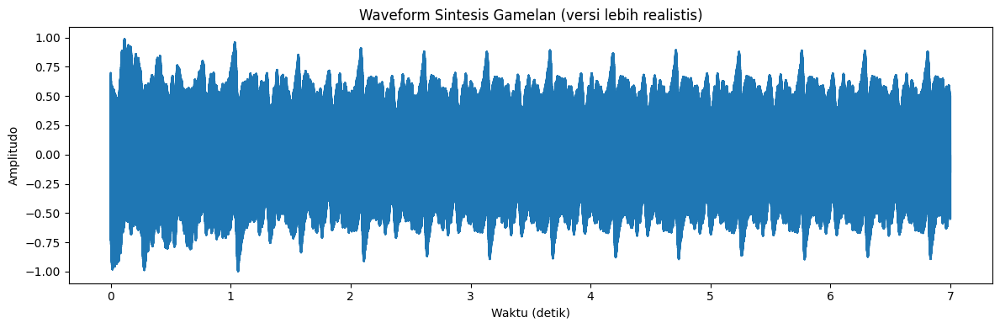

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

# === Bessel Approximation ===
def J0_approx(x):
    return 1 - (x**2)/4 + (x**4)/64 - (x**6)/2304 + (x**8)/147456

def J1_approx(x):
    return (x/2) - (x**3)/16 + (x**5)/384 - (x**7)/18432 + (x**9)/1474560

# FFT peak finder
def find_fft_peaks(y, sr, threshold_ratio=0.05):
    fft_spectrum = np.abs(np.fft.rfft(y))
    freqs = np.fft.rfftfreq(len(y), 1/sr)
    threshold = np.max(fft_spectrum) * threshold_ratio
    peak_mask = fft_spectrum > threshold
    peak_freqs = freqs[peak_mask]
    peak_amps = fft_spectrum[peak_mask]
    return peak_freqs, peak_amps, fft_spectrum, freqs

# Estimasi I dari carrier dan sideband
def estimate_I(y, sr, f_c, f_m):
    peak_freqs, peak_amps, fft_spectrum, freqs = find_fft_peaks(y, sr)

    idx_carrier = np.argmin(np.abs(freqs - f_c))
    amp_c = fft_spectrum[idx_carrier]

    sideband_freqs = [f_c + f_m, f_c - f_m]
    amp_sb = 0
    for sb_freq in sideband_freqs:
        if 0 < sb_freq < sr/2:
            idx_sb = np.argmin(np.abs(freqs - sb_freq))
            amp_sb = max(amp_sb, fft_spectrum[idx_sb])

    amp_ratio = amp_sb / amp_c if amp_c != 0 else 0

    if amp_ratio < 0.1:
        I_est = 0.5
    else:
        I_grid = np.linspace(0.1, 10, 10000)
        bessel_ratio = J1_approx(I_grid) / J0_approx(I_grid)
        I_est = I_grid[np.argmin(np.abs(bessel_ratio - amp_ratio))]

    print(f"Estimasi I: {I_est:.2f} (rasio sideband/carrier = {amp_ratio:.3f})")
    return I_est

# Bandpass filter sederhana via FFT masking
def bandpass_fft(x, sr, f_center, bw):
    X = np.fft.rfft(x)
    freqs = np.fft.rfftfreq(len(x), 1/sr)
    mask = np.exp(-0.5 * ((freqs - f_center) / bw)**2)  # Gaussian mask
    X_filtered = X * mask
    return np.fft.irfft(X_filtered, n=len(x))

# Sintesis FM dengan efek pukulan gamelan (versi lebih realistis)
def synthesize_fm(f_c, f_m, I0, duration=7.0, sr=44100,
                  attack_rate=30, decay_rate=0.8, noise_burst_ms=10,
                  noise_level=0.3, bp_bw=200, add_partials=6, partial_decay=0.6,
                  secondary_mod_ratio=0.25):

    t = np.linspace(0, duration, int(sr * duration), endpoint=False)

    # Envelope pukulan
    attack_env = 1 - np.exp(-attack_rate * t)
    decay_env = np.exp(-decay_rate * t)
    amp_env = attack_env * decay_env

    # Indeks modulasi meredup
    I_t = I0 * np.exp(-0.5 * t)

    # Noise burst
    noise = np.random.normal(0, 1, size=len(t))
    noise_burst = np.zeros_like(t)
    burst_duration = int((noise_burst_ms / 1000) * sr)
    if burst_duration > 0:
        window = 0.5 * (1 - np.cos(2 * np.pi * np.arange(burst_duration) / burst_duration))
        noise_burst[:burst_duration] = noise[:burst_duration] * window
    # Bandpass dekat f_c
    noise_burst = bandpass_fft(noise_burst, sr, f_c, bp_bw)

    # FM synthesis (utama)
    y_fm = amp_env * np.sin(2 * np.pi * f_c * t +
                            I_t * np.sin(2 * np.pi * f_m * t +
                                         secondary_mod_ratio * np.sin(2 * np.pi * 2 * f_m * t)))

    # Tambah partial harmonik
    y_partials = np.zeros_like(t)
    for k in range(2, add_partials+2):
        decay = partial_decay ** (k-1)
        freq_k = f_c * k * (1.0 + 0.001 * k)  # sedikit inharmonic
        y_partials += decay * np.sin(2 * np.pi * freq_k * t)

    # Gabung total
    y_total = y_fm + y_partials + noise_level * noise_burst
    y_total /= np.max(np.abs(y_total))  # Normalisasi

    return t, y_total

# === MAIN ===
file_path = "saron_p6.wav"
y_ref, sr = librosa.load(file_path, sr=None)
y_ref = y_ref[:int(sr * 3)]  # 3 detik pertama

# Cari frekuensi carrier (puncak terbesar)
Y = np.abs(np.fft.rfft(y_ref))
freqs = np.fft.rfftfreq(len(y_ref), 1/sr)
f_c = freqs[np.argmax(Y)]

# Cari kandidat f_m = selisih puncak berikutnya
peak_freqs, _, _, _ = find_fft_peaks(y_ref, sr)
if len(peak_freqs) > 1:
    f_m = np.abs(peak_freqs[1] - f_c)
else:
    f_m = 150.0

# Estimasi I
I_est = estimate_I(y_ref, sr, f_c=f_c, f_m=f_m)

# Sintesis dengan efek pukulan gamelan (versi lebih realistis)
t, y_synth = synthesize_fm(
    f_c=f_c, f_m=f_m, I0=I_est, duration=7.0, sr=sr,
    attack_rate=50, decay_rate=1.2, noise_burst_ms=8,
    noise_level=0.4, bp_bw=150, add_partials=8, partial_decay=0.7,
    secondary_mod_ratio=0.3
)

# Plot hasil sintesis
plt.figure(figsize=(12, 4))
plt.plot(t, y_synth)
plt.title('Waveform Sintesis Gamelan (versi lebih realistis)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()

# Playback audio
ipd.display(ipd.Audio(y_synth, rate=sr))
